# Projet

L’importation des bibliothèques à utiliser

In [131]:
# Importing Libraries
# module imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import random
import matplotlib.pyplot as plt

# model imports
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.metrics import roc_curve, auc
from sklearn.svm import SVC

from sklearn.preprocessing import MinMaxScaler, LabelEncoder, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import RandomizedSearchCV 

# Loading Data:

In [132]:
dataset_train=pd.read_csv('C:/Users/hp/Desktop/cours/ML/projet_final/NSL-KDD/KDDTrain+.txt')

In [133]:
dataset_test=pd.read_csv('C:/Users/hp/Desktop/cours/ML/projet_final/NSL-KDD/KDDTest+.txt')

In [134]:
dataset_train.head()
#43 clomuns 

,0,tcp,ftp_data,SF,491,0.1,0.2,0.3,0.4,0.5,...,0.17,0.03,0.17.1,0.00.6,0.00.7,0.00.8,0.05,0.00.9,normal,20
0,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,normal,15
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19
2,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,normal,21
3,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,normal,21
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21


In [135]:
dataset_test.head()

,0,tcp,private,REJ,0.1,0.2,0.3,0.4,0.5,0.6,...,0.04.1,0.06.1,0.00.3,0.00.4,0.00.5,0.00.6,1.00.2,1.00.3,neptune,21
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21
1,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal,21
2,0,icmp,eco_i,SF,20,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.00,0.0,0.00,0.00,saint,15
3,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.31,0.17,0.03,0.02,0.00,0.0,0.83,0.71,mscan,11
4,0,tcp,http,SF,267,14515,0,0,0,0,...,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,normal,21


In [136]:
print("Shape of Training Dataset:", dataset_train.shape)
print("Shape of Testing Dataset:", dataset_test.shape)

Shape of Training Dataset: (125972, 43)
Shape of Testing Dataset: (22543, 43)


 DATA PRE-PROCESSING 


In [137]:
 col_names = ["duration","protocol_type","service","flag","src_bytes",
    "dst_bytes","land","wrong_fragment","urgent","hot","num_failed_logins",
    "logged_in","num_compromised","root_shell","su_attempted","num_root",
    "num_file_creations","num_shells","num_access_files","num_outbound_cmds",
    "is_host_login","is_guest_login","count","srv_count","serror_rate",
    "srv_serror_rate","rerror_rate","srv_rerror_rate","same_srv_rate",
    "diff_srv_rate","srv_diff_host_rate","dst_host_count","dst_host_srv_count",
    "dst_host_same_srv_rate","dst_host_diff_srv_rate","dst_host_same_src_port_rate",
    "dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate",
    "dst_host_rerror_rate","dst_host_srv_rerror_rate","xAttack","level"]


In [138]:
dataset_train = pd.read_csv("C:/Users/hp/Desktop/cours/ML/projet_final/NSL-KDD/KDDTrain+.txt", header=None, names = col_names)
dataset_train


,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,xAttack,level
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125968,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune,20
125969,8,udp,private,SF,105,145,0,0,0,0,...,0.96,0.01,0.01,0.00,0.00,0.00,0.00,0.00,normal,21
125970,0,tcp,smtp,SF,2231,384,0,0,0,0,...,0.12,0.06,0.00,0.00,0.72,0.00,0.01,0.00,normal,18
125971,0,tcp,klogin,S0,0,0,0,0,0,0,...,0.03,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,20


In [139]:
dataset_test = pd.read_csv("C:/Users/hp/Desktop/cours/ML/projet_final/NSL-KDD/KDDTest+.txt", header=None, names = col_names)
dataset_test

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,xAttack,level
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.04,0.06,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21
1,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal,21
3,0,icmp,eco_i,SF,20,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.00,0.0,0.00,0.00,saint,15
4,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.31,0.17,0.03,0.02,0.00,0.0,0.83,0.71,mscan,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22539,0,tcp,smtp,SF,794,333,0,0,0,0,...,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal,21
22540,0,tcp,http,SF,317,938,0,0,0,0,...,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal,21
22541,0,tcp,http,SF,54540,8314,0,0,0,2,...,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,back,15
22542,0,udp,domain_u,SF,42,42,0,0,0,0,...,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.00,normal,21


In [140]:
dataset_train.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level
count,125973.00000,1.259730e+05,1.259730e+05,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,...,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000
mean,287.14465,4.556674e+04,1.977911e+04,0.000198,0.022687,0.000111,0.204409,0.001222,0.395736,0.279250,...,115.653005,0.521242,0.082951,0.148379,0.032542,0.284452,0.278485,0.118832,0.120240,19.504060
std,2604.51531,5.870331e+06,4.021269e+06,0.014086,0.253530,0.014366,2.149968,0.045239,0.489010,23.942042,...,110.702741,0.448949,0.188922,0.308997,0.112564,0.444784,0.445669,0.306557,0.319459,2.291503
min,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.00000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.00000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,21.000000
max,42908.00000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [141]:
dataset_test.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level
count,22544.000000,2.254400e+04,2.254400e+04,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,...,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000
mean,218.859076,1.039545e+04,2.056019e+03,0.000311,0.008428,0.000710,0.105394,0.021647,0.442202,0.119899,...,140.750532,0.608722,0.090540,0.132261,0.019638,0.097814,0.099426,0.233385,0.226683,18.017965
std,1407.176612,4.727864e+05,2.121930e+04,0.017619,0.142599,0.036473,0.928428,0.150328,0.496659,7.269597,...,111.783972,0.435688,0.220717,0.306268,0.085394,0.273139,0.281866,0.387229,0.400875,4.270361
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,15.000000,0.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000
50%,0.000000,5.400000e+01,4.600000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,168.000000,0.920000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.000000,2.870000e+02,6.010000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.060000,0.030000,0.010000,0.000000,0.000000,0.360000,0.170000,21.000000
max,57715.000000,6.282565e+07,1.345927e+06,1.000000,3.000000,3.000000,101.000000,4.000000,1.000000,796.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


We notice that num_outbound_cmds equals 0 for all the individuals of both datasets so we will drop it

In [142]:
dataset_train.drop(['num_outbound_cmds'], axis=1, inplace=True)
print("The data train shape after dropping 'num_outbound_cmds' :",dataset_train.shape)
dataset_test.drop(['num_outbound_cmds'], axis=1, inplace=True)
print("The data test shape after dropping 'num_outbound_cmds' :",dataset_test.shape)

The data train shape after dropping 'num_outbound_cmds' : (125973, 42)
The data test shape after dropping 'num_outbound_cmds' : (22544, 42)


 Dealing with Missing values

In [143]:
# Missing values
print("Missing values of Training Dataset:", dataset_train.isnull().sum())
print("Missing values of Testing Dataset:", dataset_test.isnull().sum())

Missing values of Training Dataset: duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_dif

In [144]:
total_missing_values_train = dataset_train.isnull().sum().sum()
total_missing_values_test = dataset_test.isnull().sum().sum()
print("Total Missing Values in Training Dataset:", total_missing_values_train)
print("Total Missing Values in Training Dataset:", total_missing_values_test)

Total Missing Values in Training Dataset: 0
Total Missing Values in Training Dataset: 0


 Remove duplicates

In [145]:
# Duplicate values 
print("Duplicated values of Training Dataset:", dataset_train.duplicated().sum())
print("Duplicated values of Testing Dataset:", dataset_test.duplicated().sum())


Duplicated values of Training Dataset: 0
Duplicated values of Testing Dataset: 0


 Diviser l'ensemble de données en 4 ensembles de données pour chaque type d'attaque

In [146]:
# Define attack type categories
# Définir les listes de sous-classes
dos_attacks = ['neptune', 'back', 'land', 'pod', 'smurf', 'teardrop', 'mailbomb', 'apache2', 'processtable', 'udpstorm', 'worm']
u2r_attacks = ['buffer_overflow', 'loadmodule', 'perl', 'rootkit', 'ps', 'sqlattack', 'xterm']
r2l_attacks = ['ftp_write', 'guess_passwd', 'imap', 'multihop', 'phf', 'spy', 'warezclient', 'warezmaster', 'sendmail', 'named', 'snmpgetattack', 'snmpguess', 'xlock', 'xsnoop', 'httptunnel']
probe_attacks = ['ipsweep', 'nmap', 'portsweep', 'satan', 'mscan', 'saint']

# Fonction pour mapper les sous-classes en fonction de la valeur de 'xAttack'
def map_subclass(x):
    if x in dos_attacks:
        return 'Dos'
    elif x in u2r_attacks:
        return 'U2R'
    elif x in r2l_attacks:
        return 'R2L'
    elif x in probe_attacks:
        return 'Probe'
    else:
        return x  # Garder la valeur d'origine si elle ne correspond à aucune sous-classe

# Appliquer la fonction de mappage à la colonne 'xAttack' dans df
dataset_train['xAttack'] = dataset_train['xAttack'].apply(map_subclass)
dataset_test['xAttack'] = dataset_test['xAttack'].apply(map_subclass)
#print(dataset_train[['xAttack']])


In [147]:
attack_counts = dataset_train['xAttack'].value_counts()
print('The number of normal attacks is ',attack_counts[0],',',round(attack_counts[0]/dataset_train.shape[0]*100,3),'%')
print('The number of DoS attacks is ',attack_counts[1],',',round(attack_counts[1]/dataset_train.shape[0]*100,3),'%')
print('The number of Probe attacks is ',attack_counts[2],',',round(attack_counts[2]/dataset_train.shape[0]*100,3),'%')
print('The number of R2L attacks is ',attack_counts[3],',',round(attack_counts[3]/dataset_train.shape[0]*100,3),'%')
print('The number of U2R  attacks is ',attack_counts[4],',',round(attack_counts[4]/dataset_train.shape[0]*100,3),'%')

The number of normal attacks is  67343 , 53.458 %
The number of DoS attacks is  45927 , 36.458 %
The number of Probe attacks is  11656 , 9.253 %
The number of R2L attacks is  995 , 0.79 %
The number of U2R  attacks is  52 , 0.041 %


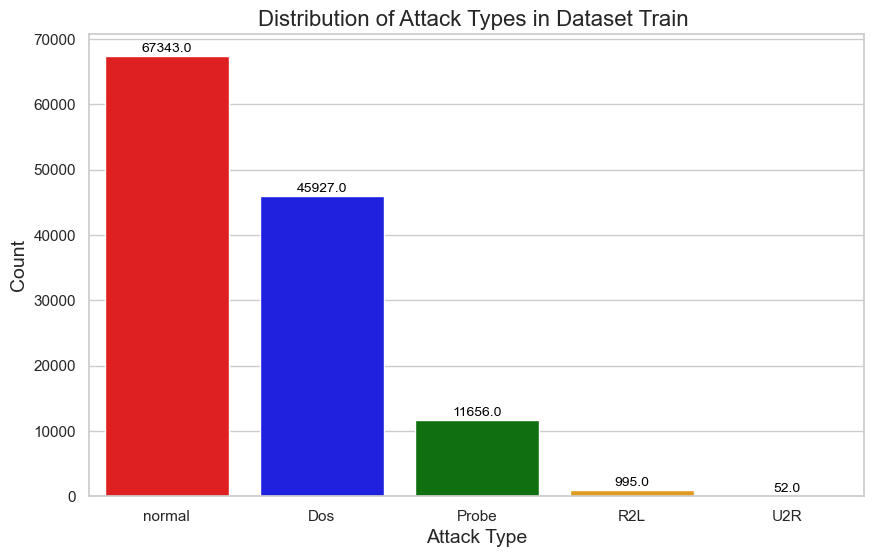

In [148]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer un barplot pour visualiser les sommes de chaque type d'attaque
attack_counts = dataset_train['xAttack'].value_counts()

# Définir un style seaborn pour une apparence plus esthétique
sns.set(style="whitegrid")

# Créer le graphique avec des couleurs personnalisées
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=attack_counts.index, y=attack_counts, palette=['red', 'blue', 'green', 'orange', 'pink'])

# Ajouter des annotations pour afficher les valeurs sur les barres
for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

# Ajouter un titre et des étiquettes d'axe
plt.title('Distribution of Attack Types in Dataset Train ', fontsize=16)
plt.xlabel('Attack Type', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Afficher le graphique
plt.show()


In [149]:
attack_counts = dataset_test['xAttack'].value_counts()
print('The number of normal attacks is ',attack_counts[0],',',round(attack_counts[0]/dataset_test.shape[0]*100,3),'%')
print('The number of DoS attacks is ',attack_counts[1],',',round(attack_counts[1]/dataset_test.shape[0]*100,3),'%')
print('The number of Probe attacks is ',attack_counts[2],',',round(attack_counts[2]/dataset_test.shape[0]*100,3),'%')
print('The number of R2L attacks is ',attack_counts[3],',',round(attack_counts[3]/dataset_test.shape[0]*100,3),'%')
print('The number of U2R  attacks is ',attack_counts[4],',',round(attack_counts[4]/dataset_test.shape[0]*100,3),'%')

The number of normal attacks is  9711 , 43.076 %
The number of DoS attacks is  7460 , 33.091 %
The number of Probe attacks is  2885 , 12.797 %
The number of R2L attacks is  2421 , 10.739 %
The number of U2R  attacks is  67 , 0.297 %


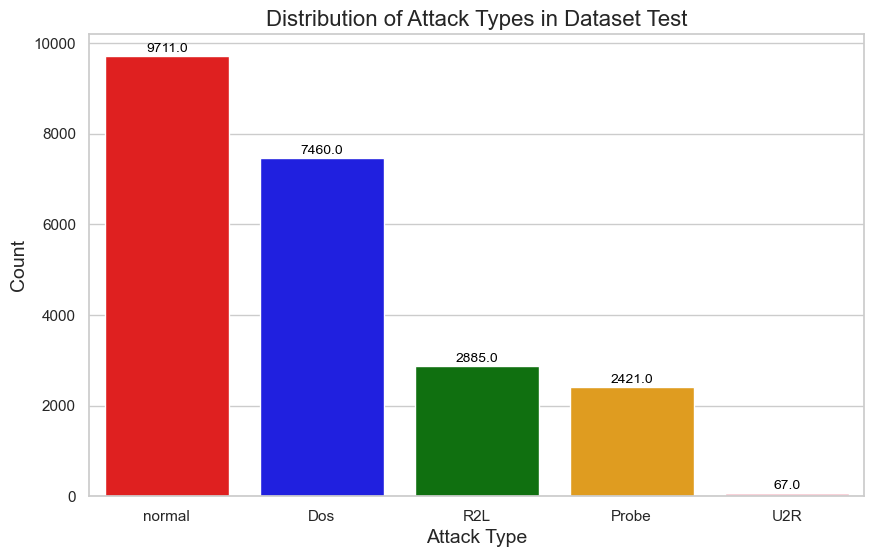

In [150]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer un barplot pour visualiser les sommes de chaque type d'attaque
attack_counts = dataset_test['xAttack'].value_counts()

# Définir un style seaborn pour une apparence plus esthétique
sns.set(style="whitegrid")

# Créer le graphique avec des couleurs personnalisées
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=attack_counts.index, y=attack_counts, palette=['red', 'blue', 'green', 'orange', 'pink'])

# Ajouter des annotations pour afficher les valeurs sur les barres
for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

# Ajouter un titre et des étiquettes d'axe
plt.title('Distribution of Attack Types in Dataset Test', fontsize=16)
plt.xlabel('Attack Type', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Afficher le graphique
plt.show()


# Correlation of Features

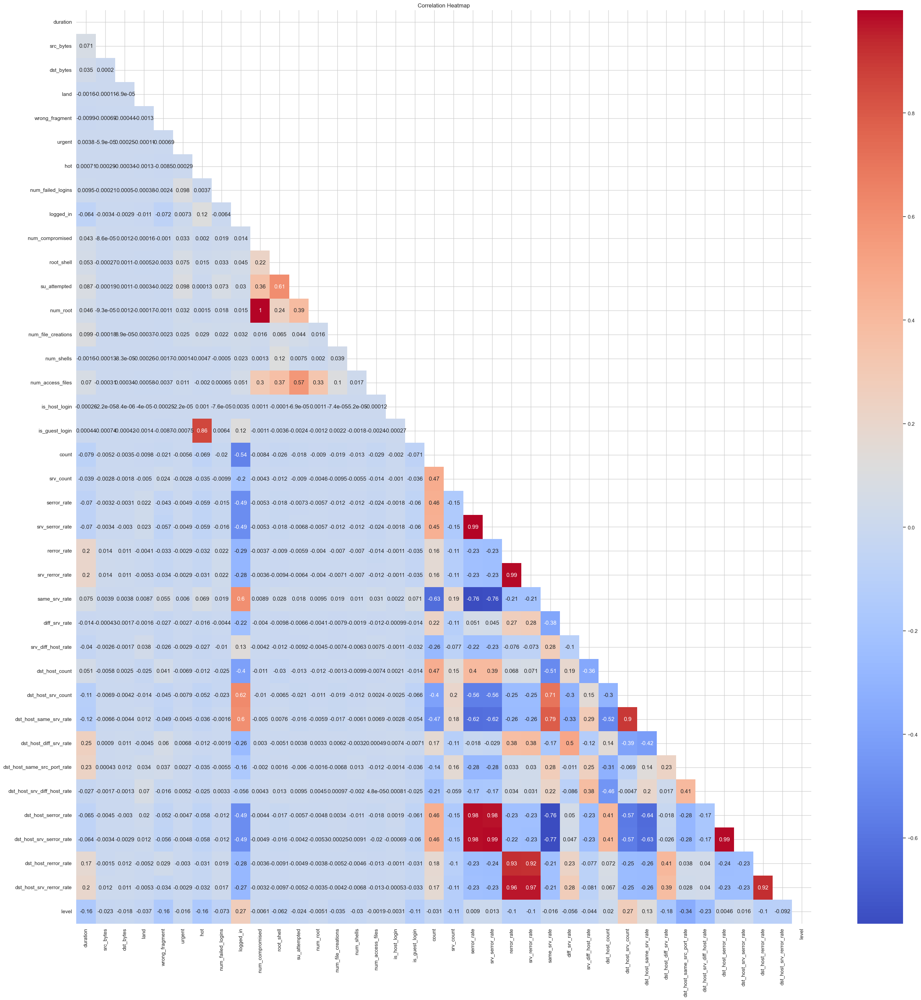

In [151]:
numeric_categorical_features = dataset_train.select_dtypes(include=['int', 'float']).columns
df_numeric_categorical = dataset_train[numeric_categorical_features]

correlation_matrix = df_numeric_categorical.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(35, 35))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', mask=mask)
plt.title('Correlation Heatmap')

plt.show()

# Encoding

Renommez chaque type d'attaque : 0=normal, 1=DoS, 2=Probe, 3=R2L et 4=U2R.

In [152]:
# Définir la correspondance entre les valeurs actuelles et les nouvelles valeurs
mapping = {'normal': 0, 'Dos': 1, 'Probe': 2, 'R2L': 3, 'U2R': 4}

# Appliquer la correspondance à la colonne 'Attack_Type' dans le jeu de données d'entraînement
dataset_train['xAttack'] = dataset_train['xAttack'].map(mapping).astype(int)

# Appliquer la correspondance à la colonne 'Attack_Type' dans le jeu de données de test
dataset_test['xAttack'] = dataset_test['xAttack'].map(mapping).astype(int)

# Afficher le jeu de données d'entraînement avec la colonne 'Attack_Type' renommée
print(dataset_train[['xAttack']])



        xAttack
0             0
1             0
2             1
3             0
4             0
...         ...
125968        1
125969        0
125970        0
125971        1
125972        0

[125973 rows x 1 columns]


In [153]:
# Convert specified columns to 'category' data type
dataset_train[['protocol_type','service', 'flag']]=dataset_train[['protocol_type','service', 'flag']].astype('category')

dataset_test[['protocol_type','service', 'flag']]=dataset_test[['protocol_type','service', 'flag']].astype('category')

In [154]:
# obtenir une liste de colonnes catégorielles dans une variable, categorical_columns
categorical_columns=['protocol_type', 'service', 'flag'] 
 # Obtenez les valeurs catégorielles dans un tableau numpy 2D
dataset_train_categorical_values = dataset_train[categorical_columns]
dataset_test_categorical_values = dataset_test[categorical_columns]


In [155]:
print(dataset_train_categorical_values.head())
print("\n",dataset_test_categorical_values.head())


  protocol_type   service flag
0           tcp  ftp_data   SF
1           udp     other   SF
2           tcp   private   S0
3           tcp      http   SF
4           tcp      http   SF

   protocol_type   service  flag
0           tcp   private   REJ
1           tcp   private   REJ
2           tcp  ftp_data    SF
3          icmp     eco_i    SF
4           tcp    telnet  RSTO


### conaitre les valeurs unique pour  les colonnes categorielle dataset train 

In [156]:
###conaitre les valeurs unique pour  les colonnes categorielle dataset train 
print("les valueurs unique de protocole type  pour le dataset train ",dataset_train.protocol_type.unique())
print("les valueurs unique de service pour le dataset train ",dataset_train.service.unique())
print("les valueurs unique de flag pour le dataset train ",dataset_train.flag.unique())

les valueurs unique de protocole type  pour le dataset train  ['tcp', 'udp', 'icmp']
Categories (3, object): ['icmp', 'tcp', 'udp']
les valueurs unique de service pour le dataset train  ['ftp_data', 'other', 'private', 'http', 'remote_job', ..., 'http_8001', 'aol', 'http_2784', 'tftp_u', 'harvest']
Length: 70
Categories (70, object): ['IRC', 'X11', 'Z39_50', 'aol', ..., 'uucp', 'uucp_path', 'vmnet', 'whois']
les valueurs unique de flag pour le dataset train  ['SF', 'S0', 'REJ', 'RSTR', 'SH', ..., 'S1', 'RSTOS0', 'S3', 'S2', 'OTH']
Length: 11
Categories (11, object): ['OTH', 'REJ', 'RSTO', 'RSTOS0', ..., 'S2', 'S3', 'SF', 'SH']


In [157]:
###conaitre les valeurs unique pour  les colonnes categorielle dataset test 
print("les valueurs unique de protocole type  pour le dataset test",dataset_test.protocol_type.unique())
print("les valueurs unique de service pour le dataset test ",dataset_test.service.unique())
print("les valueurs unique de flag pour le dataset test",dataset_test.flag.unique())

les valueurs unique de protocole type  pour le dataset test ['tcp', 'icmp', 'udp']
Categories (3, object): ['icmp', 'tcp', 'udp']
les valueurs unique de service pour le dataset test  ['private', 'ftp_data', 'eco_i', 'telnet', 'http', ..., 'efs', 'X11', 'ntp_u', 'klogin', 'tftp_u']
Length: 64
Categories (64, object): ['IRC', 'X11', 'Z39_50', 'auth', ..., 'uucp', 'uucp_path', 'vmnet', 'whois']
les valueurs unique de flag pour le dataset test ['REJ', 'SF', 'RSTO', 'S0', 'RSTR', ..., 'S3', 'S2', 'S1', 'RSTOS0', 'OTH']
Length: 11
Categories (11, object): ['OTH', 'REJ', 'RSTO', 'RSTOS0', ..., 'S2', 'S3', 'SF', 'SH']


#### on remarque que 6 types de service n'existe pas au niveau de dataset test  

## Transformez les caractéristiques catégorielles en nombres à l'aide de LabelEncoder()

In [158]:
#Transform categorical features into numbers using LabelEncoder()
dataset_train_categorical_values_enc=dataset_train_categorical_values.apply(LabelEncoder().fit_transform)
print(dataset_train_categorical_values_enc.head())
# test set
dataset_test_categorical_values_enc=dataset_test_categorical_values.apply(LabelEncoder().fit_transform)

   protocol_type  service  flag
0              1       20     9
1              2       44     9
2              1       49     5
3              1       24     9
4              1       24     9


In [159]:
#protocol type
unique_protocol=dataset_train.protocol_type.unique()

unique_protocol2=['Protocol_type_'+ x for x in unique_protocol]
# service
unique_service=dataset_train.service.unique()

unique_service2=['service_'+ x for x in unique_service]
# flag
unique_flag=dataset_train.flag.unique()

unique_flag2=['flag_'+ x for x in unique_flag]
# put together
dumcols=unique_protocol2 + unique_service2 + unique_flag2
print(dumcols)

#do same for test set
unique_service_test=dataset_test.service.unique()
unique_service2_test=['service_'+ x for x in unique_service_test]
testdumcols=unique_protocol2 + unique_service2_test + unique_flag2
print("\n dataset test ",testdumcols)

['Protocol_type_tcp', 'Protocol_type_udp', 'Protocol_type_icmp', 'service_ftp_data', 'service_other', 'service_private', 'service_http', 'service_remote_job', 'service_name', 'service_netbios_ns', 'service_eco_i', 'service_mtp', 'service_telnet', 'service_finger', 'service_domain_u', 'service_supdup', 'service_uucp_path', 'service_Z39_50', 'service_smtp', 'service_csnet_ns', 'service_uucp', 'service_netbios_dgm', 'service_urp_i', 'service_auth', 'service_domain', 'service_ftp', 'service_bgp', 'service_ldap', 'service_ecr_i', 'service_gopher', 'service_vmnet', 'service_systat', 'service_http_443', 'service_efs', 'service_whois', 'service_imap4', 'service_iso_tsap', 'service_echo', 'service_klogin', 'service_link', 'service_sunrpc', 'service_login', 'service_kshell', 'service_sql_net', 'service_time', 'service_hostnames', 'service_exec', 'service_ntp_u', 'service_discard', 'service_nntp', 'service_courier', 'service_ctf', 'service_ssh', 'service_daytime', 'service_shell', 'service_netsta

## One-Hot-Encoding pour les attributs de type categorie

In [160]:
#One-Hot-Encoding¶
#train set
enc = OneHotEncoder()
dataset_train_categorical_encoder = enc.fit_transform(dataset_train_categorical_values_enc)
dataset_train_cat_data = pd.DataFrame(dataset_train_categorical_encoder.toarray(),columns=dumcols)
# test set
dataset_test_categorical_values_encenc = enc.fit_transform(dataset_test_categorical_values_enc)
dataset_test_cat_data = pd.DataFrame(dataset_test_categorical_values_encenc.toarray(),columns=testdumcols)




In [161]:
dataset_train_cat_data

,Protocol_type_tcp,Protocol_type_udp,Protocol_type_icmp,service_ftp_data,service_other,service_private,service_http,service_remote_job,service_name,service_netbios_ns,...,flag_S0,flag_REJ,flag_RSTR,flag_SH,flag_RSTO,flag_S1,flag_RSTOS0,flag_S3,flag_S2,flag_OTH
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125968,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
125969,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
125970,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
125971,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [162]:
dataset_test_cat_data

,Protocol_type_tcp,Protocol_type_udp,Protocol_type_icmp,service_private,service_ftp_data,service_eco_i,service_telnet,service_http,service_smtp,service_ftp,...,flag_S0,flag_REJ,flag_RSTR,flag_SH,flag_RSTO,flag_S1,flag_RSTOS0,flag_S3,flag_S2,flag_OTH
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22539,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
22540,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
22541,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
22542,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# Ajouter 6 catégories manquantes à l'ensemble de test

In [163]:
trainservice=dataset_train['service'].tolist()
testservice= dataset_test['service'].tolist()
difference=list(set(trainservice) - set(testservice))
difference=[ 'service_' + x for x in difference]
difference

['service_red_i',
 'service_urh_i',
 'service_http_2784',
 'service_http_8001',
 'service_aol',
 'service_harvest']

In [164]:
for col in difference:
    dataset_test_cat_data[col] = 0

dataset_test_cat_data.shape

(22544, 84)

In [165]:
dataset_test_cat_data

,Protocol_type_tcp,Protocol_type_udp,Protocol_type_icmp,service_private,service_ftp_data,service_eco_i,service_telnet,service_http,service_smtp,service_ftp,...,flag_RSTOS0,flag_S3,flag_S2,flag_OTH,service_red_i,service_urh_i,service_http_2784,service_http_8001,service_aol,service_harvest
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0,0,0,0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0,0,0,0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22539,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0,0,0,0
22540,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0,0,0,0
22541,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0,0,0,0
22542,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0,0,0,0,0,0


## Joindre la set de données catégorielle codée avec la set de données non catégorielle


In [166]:
#Join encoded categorical dataframe with the non-categorical dataframe
newdf=dataset_train.join(dataset_train_cat_data)
newdf.drop('flag', axis=1, inplace=True)
newdf.drop('protocol_type', axis=1, inplace=True)
newdf.drop('service', axis=1, inplace=True)
# test data
newdf_test=dataset_test.join(dataset_test_cat_data)
newdf_test.drop('flag', axis=1, inplace=True)
newdf_test.drop('protocol_type', axis=1, inplace=True)
newdf_test.drop('service', axis=1, inplace=True)
print(newdf.shape)
print(newdf_test.shape)

(125973, 123)
(22544, 123)


In [170]:
columns=newdf.columns

In [171]:
newdf

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_S0,flag_REJ,flag_RSTR,flag_SH,flag_RSTO,flag_S1,flag_RSTOS0,flag_S3,flag_S2,flag_OTH
0,0,491,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,146,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0,232,8153,0,0,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0,199,420,0,0,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125968,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
125969,8,105,145,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
125970,0,2231,384,0,0,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
125971,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


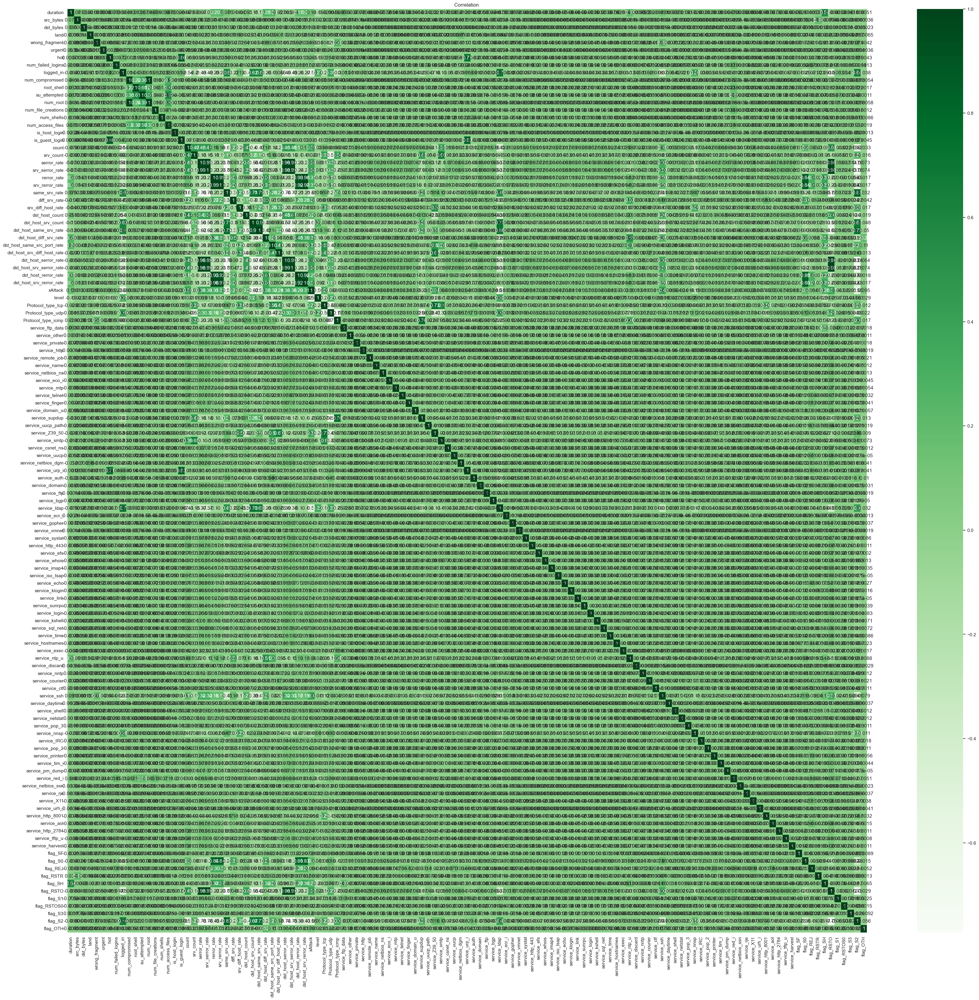

In [38]:
# Compute the correlation matrix
corr_matrix = newdf.corr()

# Plot the heatmap
plt.figure(figsize=(43, 40))
sns.heatmap(corr_matrix, annot=True, cmap='Greens')
plt.title('Correlation ')
plt.show()

# Diviser l'ensemble de données en 4 ensembles de données pour chaque type d'attaque

In [39]:
#
to_drop_DoS = [2,3,4]
to_drop_Probe = [1,3,4]
to_drop_R2L = [1,2,4]
to_drop_U2R = [1,2,3]
#train
DoS_df=newdf[~newdf['xAttack'].isin(to_drop_DoS)]
Probe_df=newdf[~newdf['xAttack'].isin(to_drop_Probe)]
R2L_df=newdf[~newdf['xAttack'].isin(to_drop_R2L)]
U2R_df=newdf[~newdf['xAttack'].isin(to_drop_U2R)]
#test
DoS_df_test=newdf_test[~newdf_test['xAttack'].isin(to_drop_DoS)]
Probe_df_test=newdf_test[~newdf_test['xAttack'].isin(to_drop_Probe)]
R2L_df_test=newdf_test[~newdf_test['xAttack'].isin(to_drop_R2L)]
U2R_df_test=newdf_test[~newdf_test['xAttack'].isin(to_drop_U2R)]

In [40]:
print('Train:')
print('Dimensions of DoS:' ,DoS_df.shape)
print('Dimensions of Probe:' ,Probe_df.shape)
print('Dimensions of R2L:' ,R2L_df.shape)
print('Dimensions of U2R:' ,U2R_df.shape)
print('Test:')
print('Dimensions of DoS:' ,DoS_df_test.shape)
print('Dimensions of Probe:' ,Probe_df_test.shape)
print('Dimensions of R2L:' ,R2L_df_test.shape)
print('Dimensions of U2R:' ,U2R_df_test.shape)

Train:
Dimensions of DoS: (113270, 123)
Dimensions of Probe: (78999, 123)
Dimensions of R2L: (68338, 123)
Dimensions of U2R: (67395, 123)
Test:
Dimensions of DoS: (17171, 123)
Dimensions of Probe: (12132, 123)
Dimensions of R2L: (12596, 123)
Dimensions of U2R: (9778, 123)


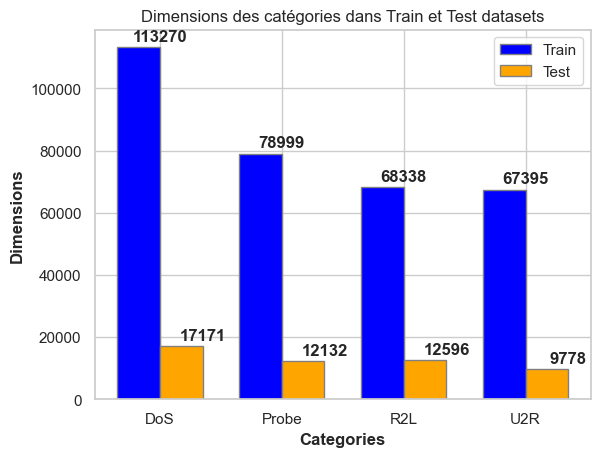

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# Dimensions des catégories pour l'ensemble d'entraînement
train_dimensions = [DoS_df.shape[0], Probe_df.shape[0], R2L_df.shape[0], U2R_df.shape[0]]

# Dimensions des catégories pour l'ensemble de test
test_dimensions = [DoS_df_test.shape[0], Probe_df_test.shape[0], R2L_df_test.shape[0], U2R_df_test.shape[0]]

# Catégories
categories = ['DoS', 'Probe', 'R2L', 'U2R']

# Largeur des barres
bar_width = 0.35

# Position des barres sur l'axe des x
r1 = np.arange(len(categories))
r2 = [x + bar_width for x in r1]

# Créer l'histogramme
plt.bar(r1, train_dimensions, color='blue', width=bar_width, edgecolor='grey', label='Train')
plt.bar(r2, test_dimensions, color='orange', width=bar_width, edgecolor='grey', label='Test')

# Ajouter des étiquettes
plt.xlabel('Categories', fontweight='bold')
plt.ylabel('Dimensions', fontweight='bold')
plt.xticks([r + bar_width / 2 for r in range(len(categories))], categories)
plt.title('Dimensions des catégories dans Train et Test datasets')

# Ajouter les dimensions au-dessus des barres
for i in range(len(categories)):
    plt.text(r1[i] + bar_width / 2, train_dimensions[i] + 1000, str(train_dimensions[i]), ha='center', va='bottom', fontweight='bold')
    plt.text(r2[i] + bar_width / 2, test_dimensions[i] + 1000, str(test_dimensions[i]), ha='center', va='bottom', fontweight='bold')

# Ajouter une légende
plt.legend()

# Afficher l'histogramme
plt.show()


# Data Normalization


## Feature Scaling:¶

In [172]:
# Split data into X & Y
# assign X as a data of feautures and Y to target
X_DoS = DoS_df.drop('xAttack',axis=1)
Y_DoS = DoS_df['xAttack']
X_Probe = Probe_df.drop('xAttack',axis=1)
Y_Probe = Probe_df['xAttack']
X_R2L = R2L_df.drop('xAttack',axis=1)
Y_R2L = R2L_df['xAttack']
X_U2R = U2R_df.drop('xAttack',axis=1)
Y_U2R = U2R_df['xAttack']
# test set
X_DoS_test = DoS_df_test.drop('xAttack',axis=1)
Y_DoS_test = DoS_df_test['xAttack']
X_Probe_test = Probe_df_test.drop('xAttack',axis=1)
Y_Probe_test = Probe_df_test['xAttack']
X_R2L_test = R2L_df_test.drop('xAttack',axis=1)
Y_R2L_test = R2L_df_test['xAttack']
X_U2R_test = U2R_df_test.drop('xAttack',axis=1)
Y_U2R_test = U2R_df_test['xAttack']

# Normalization

In [173]:
sc = MinMaxScaler()
scaler1 = sc.fit(X_DoS)
X_DoS=scaler1.transform(X_DoS) 
scaler2 = sc.fit(X_Probe)
X_Probe=scaler2.transform(X_Probe) 
scaler3 = sc.fit(X_R2L)
X_R2L=scaler3.transform(X_R2L) 
scaler4 = sc.fit(X_U2R)
X_U2R=scaler4.transform(X_U2R) 
# test data
scaler5 = sc.fit(X_DoS_test)
X_DoS_test=scaler5.transform(X_DoS_test) 
scaler6 =sc.fit(X_Probe_test)
X_Probe_test=scaler6.transform(X_Probe_test) 
scaler7 =sc.fit(X_R2L_test)
X_R2L_test=scaler7.transform(X_R2L_test) 
scaler8 = sc.fit(X_U2R_test)
X_U2R_test=scaler8.transform(X_U2R_test)


In [174]:
scaler_X = sc.fit(newdf)
newdf=scaler1.transform(newdf) 
scaler_y = sc.fit(newdf_test)
newdf_test=scaler1.transform(newdf_test) 

In [175]:
newdf

array([[0.00000000e+00, 3.55806412e-07, 0.00000000e+00, ...,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.05799870e-07, 0.00000000e+00, ...,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 1.61670897e-06, 2.93143779e-07, ...,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.09423153e-07, 0.00000000e+00, ...,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00]])

In [176]:
newdf_test

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.46530365e-05, 2.06651271e-04, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 8.68116792e-04, 6.17715522e-03, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 6.68516782e-07, 3.12052585e-05, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [177]:
X_train_encoded_df = pd.DataFrame(newdf)
X_test_encoded_df = pd.DataFrame(newdf_test)
final_data = pd.concat([X_train_encoded_df, X_test_encoded_df], axis=0)
final_data.columns=columns
final_data.to_csv("C:/Users/hp/Downloads/data_paper1.csv",index=False,sep=';')

In [178]:
final_data

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_S0,flag_REJ,flag_RSTR,flag_SH,flag_RSTO,flag_S1,flag_RSTOS0,flag_S3,flag_S2,flag_OTH
0,0.0,3.558064e-07,0.000000e+00,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,1.057999e-07,0.000000e+00,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.681203e-07,6.223962e-06,0.0,0.0,0.0,0.000000,0.0,1.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,1.442067e-07,3.206260e-07,0.0,0.0,0.0,0.000000,0.0,1.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22539,0.0,1.263815e-05,2.474131e-04,0.0,0.0,0.0,0.000000,0.0,1.0,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22540,0.0,5.045710e-06,6.969174e-04,0.0,0.0,0.0,0.000000,0.0,1.0,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22541,0.0,8.681168e-04,6.177155e-03,0.0,0.0,0.0,0.019802,0.0,1.0,0.001256,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22542,0.0,6.685168e-07,3.120526e-05,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#  Feature Selection:

# 1. Sélection de caractéristiques univariées à l'aide du test F ANOVA

#### sélection de caractéristiques univariées avec test F ANOVA. en utilisant la méthode secondPercentile, puis RFE

#### SelectPercentile : supprime toutes les fonctionnalités, à l'exception du pourcentage de score le plus élevé spécifié 
#### f_classif : valeur F ANOVA entre étiquette/caractéristique pour les tâches de classification.

In [44]:
from sklearn.feature_selection import SelectPercentile, f_classif

selector=SelectPercentile(f_classif, percentile=10)

## Get the features that were selected: DoS

In [45]:
X_newDoS = selector.fit_transform(X_DoS,Y_DoS)
X_newDoS.shape


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [ 44  63  66  68  86 114] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


(113270, 13)

In [46]:
X_newDoS_test = selector.fit_transform(X_DoS_test,Y_DoS_test)
X_newDoS_test.shape


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [  5  14  16  82 105 115 116 117 118 119 120 121] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


(17171, 13)

In [47]:
X_Do = DoS_df.drop('xAttack',axis=1)
X_Do_test = DoS_df_test.drop('xAttack',axis=1)
colNames=list(X_Do)
colNames_test=list(X_Do_test)
colNames

['duration',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'logged_in',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_host_login',
 'is_guest_login',
 'count',
 'srv_count',
 'serror_rate',
 'srv_serror_rate',
 'rerror_rate',
 'srv_rerror_rate',
 'same_srv_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'level',
 'Protocol_type_tcp',
 'Protocol_type_udp',
 'Protocol_type_icmp',
 'service_ftp_data',
 'service_other',
 'service_private',
 'service_http',
 'service_remote_job',
 'service_name',
 'service_netbios_ns',
 'service_eco_i',
 'service_mtp',
 'service_telnet',
 'service_finger',
 'se

In [48]:

true=selector.get_support()
newcolindex_DoS=[i for i, x in enumerate(true) if x]
newcolname_DoS=list( colNames[i] for i in newcolindex_DoS )
len(newcolname_DoS)

13

In [49]:
true=selector.get_support()
newcolindex_DoS_test=[i for i, x in enumerate(true) if x]
newcolname_DoS_test=list( colNames_test[i] for i in newcolindex_DoS_test )
len(newcolname_DoS_test)

13

## Get the features that were selected: Probe

In [50]:
X_newProbe = selector.fit_transform(X_Probe,Y_Probe)
X_newProbe.shape

C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [4] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


(78999, 13)

In [51]:
true=selector.get_support()
newcolindex_Probe=[i for i, x in enumerate(true) if x]
newcolname_Probe=list( colNames[i] for i in newcolindex_Probe )
newcolname_Probe

['logged_in',
 'rerror_rate',
 'srv_rerror_rate',
 'dst_host_srv_count',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'level',
 'Protocol_type_tcp',
 'service_Z39_50',
 'service_ssh',
 'flag_S2']

## Get the features that were selected: U2R

In [52]:
X_newU2R = selector.fit_transform(X_U2R,Y_U2R)
X_newU2R.shape

C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [  4  43  44  46  47  48  49  50  51  54  57  58  62  63  64  66  67  68
  70  71  72  73  74  75  76  77  78  79  80  81  82  83  86  87  89  92
  93  96  98  99 100 107 108 109 110 114] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


(67395, 13)

In [53]:
true=selector.get_support()
newcolindex_U2R=[i for i, x in enumerate(true) if x]
newcolname_U2R=list( colNames[i] for i in newcolindex_U2R)
newcolname_U2R

['urgent',
 'hot',
 'root_shell',
 'num_file_creations',
 'num_shells',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'level',
 'service_auth',
 'service_ldap',
 'service_red_i']

## Get the features that were selected: R2L

In [54]:
X_newR2L = selector.fit_transform(X_R2L,Y_R2L)
X_newR2L.shape

C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [  4  43  44  46  47  48  49  50  51  54  57  58  62  63  64  66  67  68
  70  71  72  73  74  76  77  78  79  80  81  82  83  86  87  89  92  93
  96  98  99 100 107 108 109 110 114] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


(68338, 13)

In [55]:
true=selector.get_support()
newcolindex_R2L=[i for i, x in enumerate(true) if x]
newcolname_R2L=list( colNames[i] for i in newcolindex_R2L)
newcolname_R2L

['dst_bytes',
 'hot',
 'num_failed_logins',
 'is_guest_login',
 'dst_host_srv_count',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'level',
 'service_urp_i',
 'service_auth',
 'service_ldap',
 'service_systat',
 'flag_REJ']

## Summary of features selected by Univariate Feature Selection


In [56]:
print('Features selected for DoS:',newcolname_DoS)
print()
print('Features selected for Probe:',newcolname_Probe)
print()
print('Features selected for R2L:',newcolname_R2L)
print()
print('Features selected for U2R:',newcolname_U2R)

Features selected for DoS: ['logged_in', 'count', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate', 'service_ftp', 'service_http_8001', 'flag_RSTR']

Features selected for Probe: ['logged_in', 'rerror_rate', 'srv_rerror_rate', 'dst_host_srv_count', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate', 'level', 'Protocol_type_tcp', 'service_Z39_50', 'service_ssh', 'flag_S2']

Features selected for R2L: ['dst_bytes', 'hot', 'num_failed_logins', 'is_guest_login', 'dst_host_srv_count', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'level', 'service_urp_i', 'service_auth', 'service_ldap', 'service_systat', 'flag_REJ']

Features selected for U2R: ['urgent', 'hot', 'root_shell', 'num_file_creations', 'num_shells', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_hos

## 2. Recursive Feature Elimination for feature ranking:RFE

In [57]:
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
# Create a decision tree classifier. 
df = DecisionTreeClassifier(random_state=0)

#rank all features, i.e continue the elimination until the last one
rfe = RFE(df, n_features_to_select=1)
rfe.fit(X_newDoS, Y_DoS.astype('int'))
print ("DoS Features sorted by their rank:")
print (sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), newcolname_DoS)))


DoS Features sorted by their rank:
[(1, 'same_srv_rate'), (2, 'count'), (3, 'flag_RSTR'), (4, 'dst_host_rerror_rate'), (5, 'dst_host_same_srv_rate'), (6, 'dst_host_srv_count'), (7, 'dst_host_count'), (8, 'logged_in'), (9, 'rerror_rate'), (10, 'dst_host_srv_rerror_rate'), (11, 'srv_rerror_rate'), (12, 'service_ftp'), (13, 'service_http_8001')]


In [58]:
rfe.fit(X_newProbe, Y_Probe.astype(int))
print ("Probe Features sorted by their rank:")
print (sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), newcolname_Probe)))

Probe Features sorted by their rank:
[(1, 'level'), (2, 'dst_host_diff_srv_rate'), (3, 'service_ssh'), (4, 'dst_host_srv_count'), (5, 'logged_in'), (6, 'dst_host_rerror_rate'), (7, 'dst_host_same_src_port_rate'), (8, 'service_Z39_50'), (9, 'flag_S2'), (10, 'rerror_rate'), (11, 'dst_host_srv_rerror_rate'), (12, 'Protocol_type_tcp'), (13, 'srv_rerror_rate')]


In [59]:
rfe.fit(X_newR2L, Y_R2L.astype(int))
 
print ("R2L Features sorted by their rank:")
print (sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), newcolname_R2L)))

R2L Features sorted by their rank:
[(1, 'level'), (2, 'dst_host_srv_diff_host_rate'), (3, 'dst_host_same_src_port_rate'), (4, 'hot'), (5, 'service_auth'), (6, 'dst_host_srv_count'), (7, 'dst_bytes'), (8, 'service_systat'), (9, 'num_failed_logins'), (10, 'is_guest_login'), (11, 'service_urp_i'), (12, 'flag_REJ'), (13, 'service_ldap')]


In [60]:
rfe.fit(X_newU2R, Y_U2R.astype(int))
 
print ("U2R Features sorted by their rank:")
print (sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), newcolname_U2R)))

U2R Features sorted by their rank:
[(1, 'level'), (2, 'dst_host_srv_count'), (3, 'hot'), (4, 'num_file_creations'), (5, 'dst_host_count'), (6, 'service_auth'), (7, 'dst_host_srv_diff_host_rate'), (8, 'dst_host_same_src_port_rate'), (9, 'service_red_i'), (10, 'service_ldap'), (11, 'num_shells'), (12, 'root_shell'), (13, 'urgent')]


## 2. Recursive Feature Elimination, select 13 features each of 122 ( get 13 best features from 122 )

## DOS

In [61]:
from sklearn.feature_selection import RFE
clf = DecisionTreeClassifier(random_state=0)
rfe = RFE(estimator=clf, n_features_to_select=13, step=1)
rfe.fit(X_DoS, Y_DoS.astype(int))
X_rfeDoS=rfe.transform(X_DoS)
true=rfe.support_
rfecolindex_DoS=[i for i, x in enumerate(true) if x]
rfecolname_DoS=list(colNames[i] for i in rfecolindex_DoS)
rfecolname_DoS

['src_bytes',
 'wrong_fragment',
 'count',
 'same_srv_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'level',
 'service_other',
 'service_smtp',
 'service_auth',
 'flag_S2']

In [62]:
from sklearn.feature_selection import RFE
clf = DecisionTreeClassifier(random_state=0)
rfe = RFE(estimator=clf, n_features_to_select=13, step=1)
rfe.fit(X_DoS_test, Y_DoS_test.astype(int))
X_rfeDoS=rfe.transform(X_DoS_test)
true=rfe.support_
rfecolindex_DoS=[i for i, x in enumerate(true) if x]
rfecolname_DoS=list(colNames_test[i] for i in rfecolindex_DoS)
rfecolname_DoS

['src_bytes',
 'dst_bytes',
 'count',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_diff_srv_rate',
 'dst_host_srv_diff_host_rate',
 'level',
 'Protocol_type_icmp',
 'service_domain_u',
 'service_finger',
 'service_bgp',
 'service_efs']

## Probe

In [63]:
rfe.fit(X_Probe, Y_Probe.astype(int))
X_rfeProbe=rfe.transform(X_Probe)
true=rfe.support_
rfecolindex_Probe=[i for i, x in enumerate(true) if x]
rfecolname_Probe=list(colNames[i] for i in rfecolindex_Probe)
rfecolname_Probe

['logged_in',
 'srv_count',
 'same_srv_rate',
 'dst_host_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'level',
 'service_Z39_50',
 'service_auth',
 'service_ssh']

## RFE

In [64]:

rfe.fit(X_R2L, Y_R2L.astype(int))
X_rfeR2L=rfe.transform(X_R2L)
true=rfe.support_
rfecolindex_R2L=[i for i, x in enumerate(true) if x]
rfecolname_R2L=list(colNames[i] for i in rfecolindex_R2L)
rfecolname_R2L

['src_bytes',
 'dst_bytes',
 'hot',
 'logged_in',
 'num_root',
 'serror_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'level',
 'service_auth']

## U2R

In [65]:
rfe.fit(X_U2R, Y_U2R.astype(int))
X_rfeU2R=rfe.transform(X_U2R)
true=rfe.support_
rfecolindex_U2R=[i for i, x in enumerate(true) if x]
rfecolname_U2R=list(colNames[i] for i in rfecolindex_U2R)
rfecolname_R2L

['src_bytes',
 'dst_bytes',
 'hot',
 'logged_in',
 'num_root',
 'serror_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'level',
 'service_auth']

# Summary of features selected by RFE


In [66]:
print('Features selected for DoS:',rfecolname_DoS)
print()
print('Features selected for Probe:',rfecolname_Probe)
print()
print('Features selected for R2L:',rfecolname_R2L)
print()
print('Features selected for U2R:',rfecolname_U2R)

Features selected for DoS: ['src_bytes', 'dst_bytes', 'count', 'dst_host_count', 'dst_host_srv_count', 'dst_host_diff_srv_rate', 'dst_host_srv_diff_host_rate', 'level', 'Protocol_type_icmp', 'service_domain_u', 'service_finger', 'service_bgp', 'service_efs']

Features selected for Probe: ['logged_in', 'srv_count', 'same_srv_rate', 'dst_host_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate', 'level', 'service_Z39_50', 'service_auth', 'service_ssh']

Features selected for R2L: ['src_bytes', 'dst_bytes', 'hot', 'logged_in', 'num_root', 'serror_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_srv_diff_host_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'level', 'service_auth']

Features selected for U2R: ['dst_bytes', 'num_compromised', 'count', 'dst_host_count', 'dst_host_srv_diff_host_rate', 'level', 'service_auth', 'service_hostnames', 'service_exec', 'service_ntp_u', 'service_X1

# Build the model:

# Decsion Tree


### Avec tous les features 122


In [67]:
# all features
dt=clf_DoS=DecisionTreeClassifier(random_state=0)
clf_DoS=DecisionTreeClassifier(random_state=0)
clf_Probe=DecisionTreeClassifier(random_state=0)
clf_R2L=DecisionTreeClassifier(random_state=0)
clf_U2R=DecisionTreeClassifier(random_state=0)
clf_DoS.fit(X_DoS, Y_DoS.astype(int))
clf_Probe.fit(X_Probe, Y_Probe.astype(int))
clf_R2L.fit(X_R2L, Y_R2L.astype(int))
clf_U2R.fit(X_U2R, Y_U2R.astype(int))



DecisionTreeClassifier(random_state=0)

In [68]:
print("le score de train DoS:", clf_DoS.score(X_DoS, Y_DoS))
print("le score de test DoS:", clf_DoS.score(X_DoS_test, Y_DoS_test))
print("le score de train Probe:", clf_Probe.score(X_Probe, Y_Probe))
print("le score de test Probe:", clf_DoS.score(X_Probe_test, Y_Probe_test))
print("le score de train R2L:", clf_DoS.score(X_R2L, Y_R2L))
print("le score de test R2L:", clf_DoS.score(X_R2L_test, Y_R2L_test))
print("le score de train U2R:", clf_DoS.score(X_U2R, Y_U2R))
print("le score de test U2L:", clf_DoS.score(X_U2R_test, Y_U2R_test))

le score de train DoS: 1.0
le score de test DoS: 0.9068196377613418
le score de train Probe: 1.0
le score de test Probe: 0.7876689746125948
le score de train R2L: 0.9854400187304282
le score de test R2L: 0.7584947602413464
le score de train U2R: 0.9992284294087098
le score de test U2L: 0.9772959705461239


## Avec les features selectionnee avec Anova 

In [69]:
# selected features by Anova 
clf_anvDoS=DecisionTreeClassifier(random_state=0)
clf_anvProbe=DecisionTreeClassifier(random_state=0)
clf_anvR2L=DecisionTreeClassifier(random_state=0)
clf_anvU2R=DecisionTreeClassifier(random_state=0)
clf_anvDoS.fit(X_newDoS, Y_DoS.astype(int))
clf_anvProbe.fit(X_newProbe, Y_Probe.astype(int))
clf_anvR2L.fit(X_newR2L, Y_R2L.astype(int))
clf_anvU2R.fit(X_newU2R, Y_U2R.astype(int))

DecisionTreeClassifier(random_state=0)

# Prediction & Evaluation (validation):


In [70]:
# Apply the classifier we trained to the test data 
clf_DoS.predict(X_DoS_test)

array([1, 1, 0, ..., 0, 1, 0])

In [71]:
# View the predicted probabilities of the first 10 observations
clf_DoS.predict_proba(X_DoS_test)[0:10]

array([[0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.]])

In [72]:
Y_DoS

0         0
1         0
2         1
3         0
4         0
         ..
125968    1
125969    0
125970    0
125971    1
125972    0
Name: xAttack, Length: 113270, dtype: int32

# Matrice de confusion

# Dos

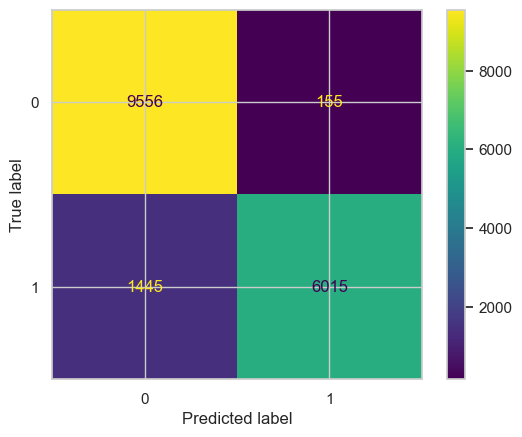

In [73]:
y_pred=clf_DoS.predict(X_DoS_test)
disp = ConfusionMatrixDisplay(confusion_matrix(Y_DoS_test,y_pred,labels=clf_DoS.classes_),display_labels=clf_DoS.classes_)
disp.plot()
plt.show()

# Probe

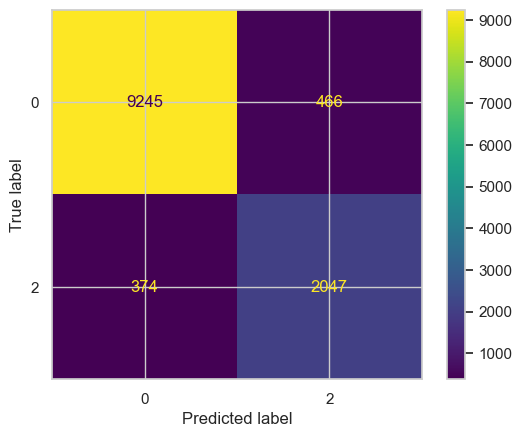

In [74]:
# Confusion Matrices : Probe
Y_Probe_pred=clf_Probe.predict(X_Probe_test)
# Create confusion matrix
pd.crosstab(Y_Probe_test, Y_Probe_pred, rownames=['Probe attacks'], colnames=['Predicted attacks'])
disp = ConfusionMatrixDisplay(confusion_matrix(Y_Probe_test, Y_Probe_pred,labels=clf_Probe.classes_),display_labels=clf_Probe.classes_)
disp.plot()
plt.show()

# R2L

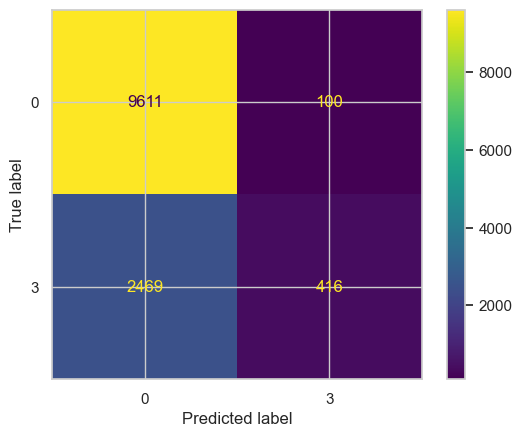

In [75]:
# Confusion Matrices : R2l
Y_R2L_pred=clf_R2L.predict(X_R2L_test)
# Create confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix(Y_R2L_test, Y_R2L_pred,labels=clf_R2L.classes_),display_labels=clf_R2L.classes_)
disp.plot()
plt.show()

# U2R

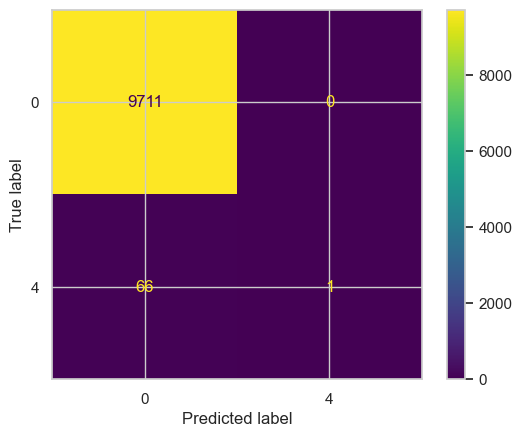

In [76]:
# Confusion Matrices : U2R

Y_U2R_pred=clf_U2R.predict(X_U2R_test)
# Create confusion matrix
pd.crosstab(Y_U2R_test, Y_U2R_pred, rownames=['U2R attacks'], colnames=['Predicted attacks'])

# Create confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix(Y_U2R_test, Y_U2R_pred,labels=clf_U2R.classes_),display_labels=clf_U2R.classes_)
disp.plot()
plt.show()

# Cross Validation: Accuracy, Precision, Recall, F-measure¶


## DoS

In [77]:
y_pred=clf_DoS.predict(X_DoS_test)
print(classification_report(Y_DoS_test,y_pred,digits=8))

              precision    recall  f1-score   support

           0  0.86864830 0.98403872 0.92275010      9711
           1  0.97487844 0.80630027 0.88261189      7460

    accuracy                      0.90681964     17171
   macro avg  0.92176337 0.89516949 0.90268099     17171
weighted avg  0.91480035 0.90681964 0.90531191     17171



In [78]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision', 'recall', 'f1']
# Initialiser une liste pour stocker les résultats
results = []
# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf_DoS, X_DoS_test, Y_DoS_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)


               Mean  Std Deviation
Accuracy   0.997612       0.002679
Precision  0.995993       0.004467
Recall     0.998525       0.003273
F-measure  0.997256       0.003079


## Probe 

In [79]:
print(classification_report(Y_Probe_test,Y_Probe_pred,digits=8))

              precision    recall  f1-score   support

           0  0.96111862 0.95201318 0.95654423      9711
           2  0.81456427 0.84551838 0.82975274      2421

    accuracy                      0.93076162     12132
   macro avg  0.88784144 0.89876578 0.89314848     12132
weighted avg  0.93187298 0.93076162 0.93124237     12132



In [80]:

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf_Probe, X_Probe_test, Y_Probe_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)



               Mean  Std Deviation
Accuracy   0.997857       0.001680
Precision  0.996809       0.003968
Recall     0.996490       0.002106
F-measure  0.996647       0.002620


## R2L

In [81]:
print(classification_report(Y_R2L_test,Y_R2L_pred,digits=8))

              precision    recall  f1-score   support

           0  0.79561258 0.98970240 0.88210729      9711
           3  0.80620155 0.14419411 0.24463393      2885

    accuracy                      0.79604636     12596
   macro avg  0.80090707 0.56694825 0.56337061     12596
weighted avg  0.79803789 0.79604636 0.73609978     12596



In [82]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf_R2L, X_R2L_test, Y_R2L_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)


               Mean  Std Deviation
Accuracy   0.996745       0.001658
Precision  0.994753       0.003542
Recall     0.996061       0.003295
F-measure  0.995398       0.002346


## U2R

In [83]:
print(classification_report(Y_U2R_test,Y_U2R_pred,digits=8))

              precision    recall  f1-score   support

           0  0.99324946 1.00000000 0.99661330      9711
           4  1.00000000 0.01492537 0.02941176        67

    accuracy                      0.99325015      9778
   macro avg  0.99662473 0.50746269 0.51301253      9778
weighted avg  0.99329572 0.99325015 0.98998592      9778



In [84]:
results = []
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf_U2R, X_U2R_test, Y_U2R_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)

               Mean  Std Deviation
Accuracy   0.998466       0.003201
Precision  0.940941       0.117900
Recall     0.955489       0.147040
F-measure  0.945476       0.117710


## KNN

In [85]:
# all features
clf3_DoS=KNeighborsClassifier()
clf3_Probe=KNeighborsClassifier()
clf3_R2L=KNeighborsClassifier()
clf3_U2R=KNeighborsClassifier()
clf3_DoS.fit(X_DoS, Y_DoS.astype(int))
clf3_Probe.fit(X_Probe, Y_Probe.astype(int))
clf3_R2L.fit(X_R2L, Y_R2L.astype(int))
clf3_U2R.fit(X_U2R, Y_U2R.astype(int))

KNeighborsClassifier()

# Matrice de confusion

## Dos

In [86]:
clf3_DoS.predict(X_DoS_test)

array([1, 1, 0, ..., 0, 1, 0])

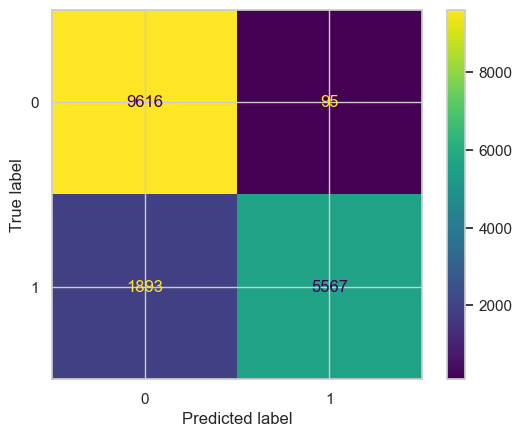

In [87]:
Y_DoS_pred=clf3_DoS.predict(X_DoS_test)
# Create confusion matrix
# Create confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix(Y_DoS_test, Y_DoS_pred,labels=clf3_DoS.classes_),display_labels=clf3_DoS.classes_)
disp.plot()
plt.show()

# Probe

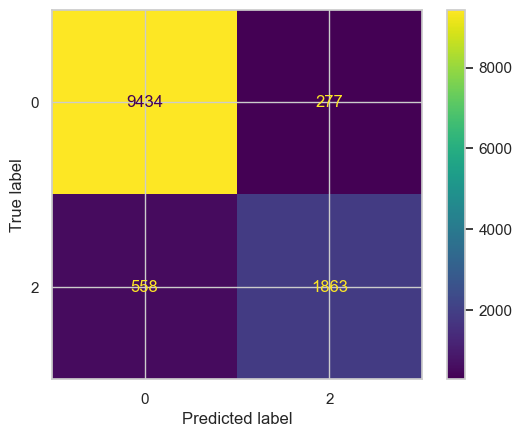

In [88]:
# Confusion Matrices : Probe
Y_Probe_pred=clf3_Probe.predict(X_Probe_test)
# Create confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix(Y_Probe_test, Y_Probe_pred,labels=clf3_Probe.classes_),display_labels=clf3_Probe.classes_)
disp.plot()
plt.show()

# R2L

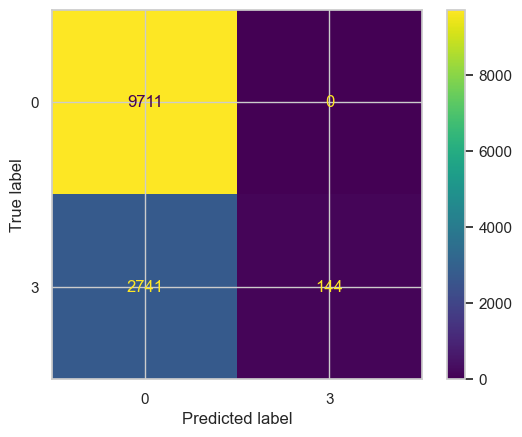

In [89]:
# Confusion Matrices : R2L
Y_R2L_pred=clf3_R2L.predict(X_R2L_test)
# Create confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix(Y_R2L_test, Y_R2L_pred,labels=clf3_R2L.classes_),display_labels=clf3_R2L.classes_)
disp.plot()
plt.show()

# U2R

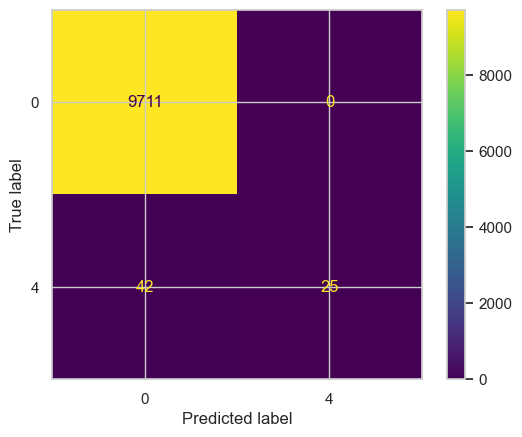

In [90]:
# Confusion Matrices : U2R
Y_U2R_pred=clf3_U2R.predict(X_U2R_test)
# Create confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix(Y_U2R_test, Y_U2R_pred,labels=clf3_U2R.classes_),display_labels=clf3_U2R.classes_)
disp.plot()
plt.show()

# Cross Validation: Accuracy, Precision, Recall, F-measure¶


# DOS

In [91]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision', 'recall', 'f1']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf3_DoS, X_DoS_test, Y_DoS_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)


               Mean  Std Deviation
Accuracy   0.997496       0.002446
Precision  0.997722       0.004156
Recall     0.996515       0.002985
F-measure  0.997117       0.002813


# R2L

In [92]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf3_R2L, X_R2L_test, Y_R2L_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)


               Mean  Std Deviation
Accuracy   0.993490       0.003673
Precision  0.989081       0.006939
Recall     0.992611       0.005020
F-measure  0.990820       0.005163


# Probe

In [93]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf3_Probe, X_Probe_test, Y_Probe_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)


               Mean  Std Deviation
Accuracy   0.997115       0.002783
Precision  0.997109       0.003714
Recall     0.993858       0.005935
F-measure  0.995468       0.004372


# U2R

In [94]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(clf3_U2R, X_U2R_test, Y_U2R_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)

# Afficher le DataFrame
print(results_df)


               Mean  Std Deviation
Accuracy   0.998568       0.002085
Precision  0.957854       0.110944
Recall     0.948449       0.092543
F-measure  0.949256       0.066698


# SVM

In [95]:

svm = SVC(C=1,random_state=0)
svm_model = svm.fit(X_DoS, Y_DoS)
y_pred = svm_model.predict(X_DoS_test)

In [96]:
svm_model_Probe = svm.fit(X_Probe, Y_Probe)
y_pred_Pro= svm_model_Probe.predict(X_Probe_test)

In [97]:
svm_model_U2R = svm.fit(X_U2R, Y_U2R)
y_pred_U = svm_model.predict(X_U2R_test)

In [98]:
svm_model_R2L = svm.fit(X_R2L, Y_R2L)
y_pred_R = svm_model.predict(X_R2L_test)

# Matrice de confusion

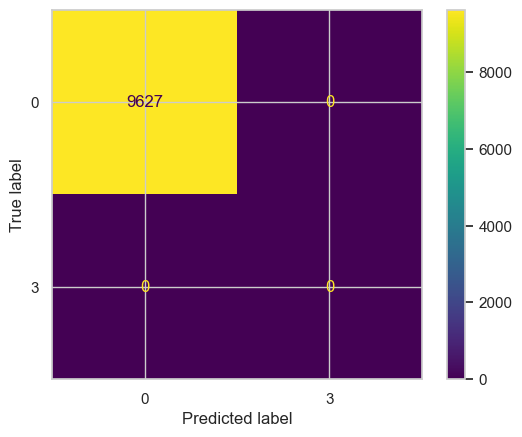

In [99]:
#MATRICE cONFUSION Dos
disp = ConfusionMatrixDisplay(confusion_matrix(Y_DoS_test,y_pred,labels=svm_model.classes_),display_labels=svm_model.classes_)
disp.plot()

plt.show()

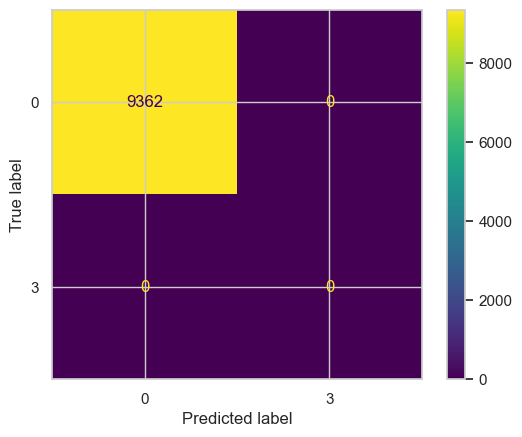

In [100]:
#MATRICE cONFUSION PRObE
disp = ConfusionMatrixDisplay(confusion_matrix(Y_Probe_test,y_pred_Pro,labels=svm_model_Probe.classes_),display_labels=svm_model_Probe.classes_)
disp.plot()

plt.show()

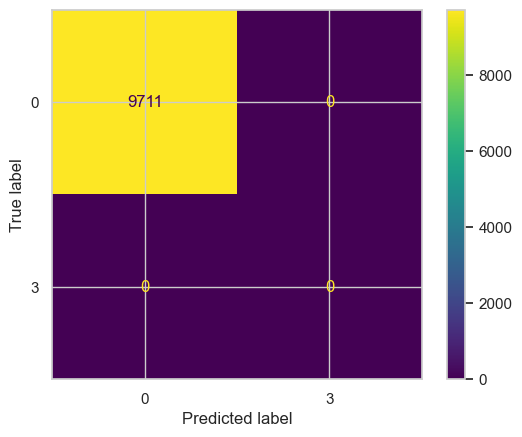

In [101]:
#MATRICE cONFUSION U2R
disp = ConfusionMatrixDisplay(confusion_matrix(Y_U2R_test,y_pred_U,labels=svm_model_U2R.classes_),display_labels=svm_model_U2R.classes_)
disp.plot()

plt.show()

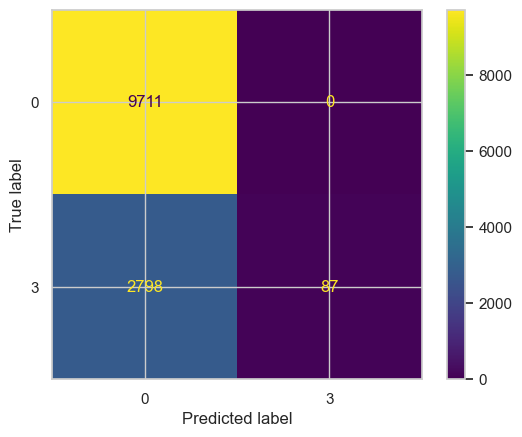

In [102]:
#MATRICE cONFUSION R2l
disp = ConfusionMatrixDisplay(confusion_matrix(Y_R2L_test,y_pred_R,labels=svm_model_R2L.classes_),display_labels=svm_model_R2L.classes_)
disp.plot()

plt.show()

# Cross Validation: Accuracy, Precision, Recall, F-measure

# DOS

In [103]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision', 'recall', 'f1']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(svm_model, X_DoS_test, Y_DoS_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)
print(results_df)


               Mean  Std Deviation
Accuracy   0.996098       0.002995
Precision  0.994652       0.004778
Recall     0.996381       0.003801
F-measure  0.995514       0.003443


# Probe

In [104]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(svm_model_Probe, X_Probe_test, Y_Probe_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)

# Afficher le DataFrame
print(results_df)


               Mean  Std Deviation
Accuracy   0.995879       0.004037
Precision  0.994178       0.007165
Recall     0.992931       0.006984
F-measure  0.993543       0.006319


# R2L

In [105]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(svm_model_R2L, X_R2L_test, Y_R2L_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)

# Afficher le DataFrame
print(results_df)


               Mean  Std Deviation
Accuracy   0.984837       0.005520
Precision  0.969640       0.010310
Recall     0.989313       0.004347
F-measure  0.978992       0.007501


# U2R

In [106]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F-measure']
metrics_functions = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# Initialiser une liste pour stocker les résultats
results = []

# Parcourir les métriques et calculer les scores
for metric_name, metric_function in zip(metrics_names, metrics_functions):
    scores = cross_val_score(svm_model_U2R, X_U2R_test, Y_U2R_test, cv=10, scoring=metric_function)
    mean_score = scores.mean()
    std_score = scores.std() * 2  # Multiplier par 2 pour obtenir l'intervalle de confiance à 95%
    results.append([mean_score, std_score])

# Créer un DataFrame pandas avec les résultats
results_df = pd.DataFrame(results, columns=['Mean', 'Std Deviation'], index=metrics_names)

# Afficher le DataFrame
print(results_df)


               Mean  Std Deviation
Accuracy   0.998159       0.002713
Precision  0.963618       0.095612
Recall     0.905695       0.180715
F-measure  0.924542       0.120407


# Logistic Regression

In [107]:
## DOS
logreg=LogisticRegression(random_state=0)

logreg.fit(X_DoS,Y_DoS)
print('score_train=',logreg.score(X_DoS,Y_DoS))
print('score_test=',logreg.score(X_DoS_test,Y_DoS_test))

y_pred_d=logreg.predict(X_DoS_test)

score_train= 0.9959124216473912
score_test= 0.8926678702463455


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


# Matrice de confusion

# Dos

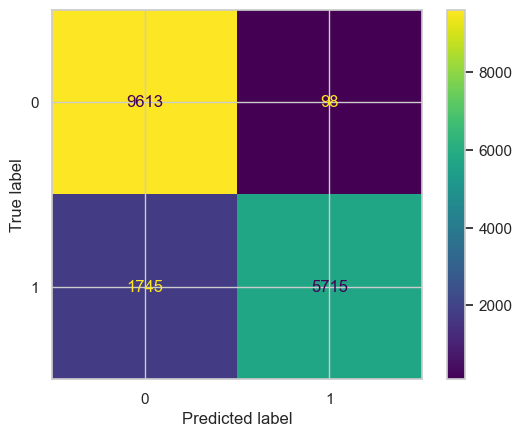

In [108]:
disp = ConfusionMatrixDisplay(confusion_matrix(Y_DoS_test,y_pred_d,labels=logreg.classes_),display_labels=logreg.classes_)
disp.plot()

plt.show()

In [109]:
print(classification_report(Y_DoS_test,y_pred_d,digits=8))

              precision    recall  f1-score   support

           0  0.84636380 0.98990835 0.91252551      9711
           1  0.98314124 0.76608579 0.86114669      7460

    accuracy                      0.89266787     17171
   macro avg  0.91475252 0.87799707 0.88683610     17171
weighted avg  0.90578723 0.89266787 0.89020381     17171



# Probe

In [110]:
###Probe
logreg.fit(X_Probe,Y_Probe)
print('score_train=',logreg.score(X_Probe,Y_Probe))
print('score_test=',logreg.score(X_Probe_test,Y_Probe_test))

y_pred_p=logreg.predict(X_Probe_test)

score_train= 0.9943670173040166
score_test= 0.9148532805802836


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


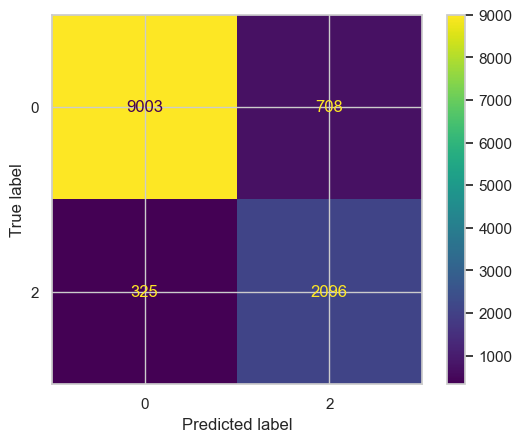

In [111]:
disp = ConfusionMatrixDisplay(confusion_matrix(Y_Probe_test,y_pred_p,labels=logreg.classes_),display_labels=logreg.classes_)
disp.plot()

plt.show()

In [112]:
print(classification_report(Y_Probe_test,y_pred_p,digits=8))

              precision    recall  f1-score   support

           0  0.96515866 0.92709299 0.94574295      9711
           2  0.74750357 0.86575795 0.80229665      2421

    accuracy                      0.91485328     12132
   macro avg  0.85633111 0.89642547 0.87401980     12132
weighted avg  0.92172452 0.91485328 0.91711754     12132



# U2R

In [113]:
###U2R
logreg.fit(X_U2R,Y_U2R)
print('score_train=',logreg.score(X_U2R,Y_U2R))
print('score_test=',logreg.score(X_U2R_test,Y_U2R_test))

y_pred_UR=logreg.predict(X_U2R_test)

score_train= 0.9997180799762594
score_test= 0.9940683166291675


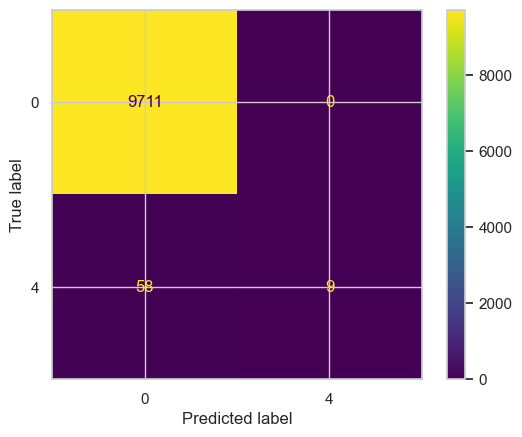

In [114]:
disp = ConfusionMatrixDisplay(confusion_matrix(Y_U2R_test,y_pred_UR,labels=logreg.classes_),display_labels=logreg.classes_)
disp.plot()

plt.show()

In [115]:
print(classification_report(Y_U2R_test,y_pred_UR,digits=8))

              precision    recall  f1-score   support

           0  0.99406285 1.00000000 0.99702259      9711
           4  1.00000000 0.13432836 0.23684211        67

    accuracy                      0.99406832      9778
   macro avg  0.99703143 0.56716418 0.61693235      9778
weighted avg  0.99410353 0.99406832 0.99181374      9778



# R2L

In [116]:
###R2L
logreg.fit(X_R2L,Y_R2L)
print('score_train=',logreg.score(X_R2L,Y_R2L))
print('score_test=',logreg.score(X_R2L_test,Y_R2L_test))

y_pred_RL=logreg.predict(X_R2L_test)

score_train= 0.9981415903304165
score_test= 0.7898539218799618


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


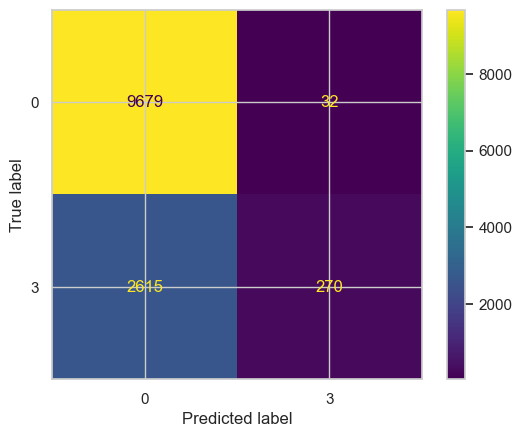

In [117]:
disp = ConfusionMatrixDisplay(confusion_matrix(Y_R2L_test,y_pred_RL,labels=logreg.classes_),display_labels=logreg.classes_)
disp.plot()

plt.show()

In [118]:
print(classification_report(Y_R2L_test,y_pred_RL,digits=8))

              precision    recall  f1-score   support

           0  0.78729462 0.99670477 0.87970916      9711
           3  0.89403974 0.09358752 0.16943834      2885

    accuracy                      0.78985392     12596
   macro avg  0.84066718 0.54514614 0.52457375     12596
weighted avg  0.81174362 0.78985392 0.71702804     12596



# Ensemble Learning 


# DOS

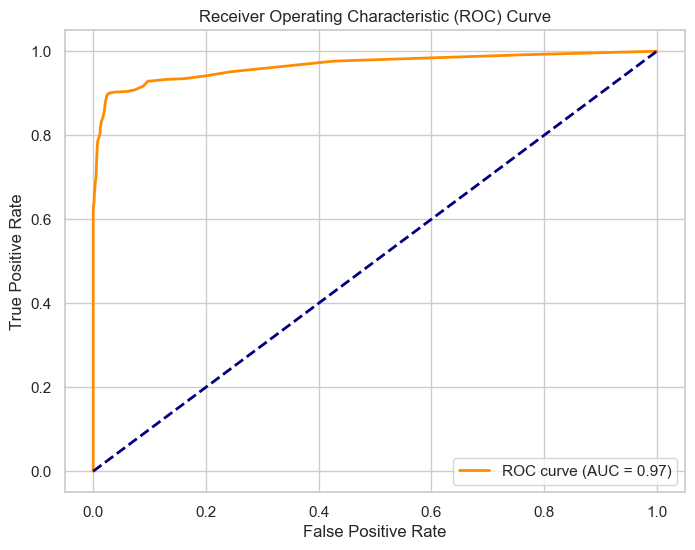

In [119]:
#########DoS
rf_model = RandomForestClassifier(n_estimators=100, random_state=0)

# Train the mode
rf_model.fit(X_DoS, Y_DoS)

# Make predictions on the test set
y_pred_proba = rf_model.predict_proba(X_DoS_test)[:, 1]  

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_DoS_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Probe

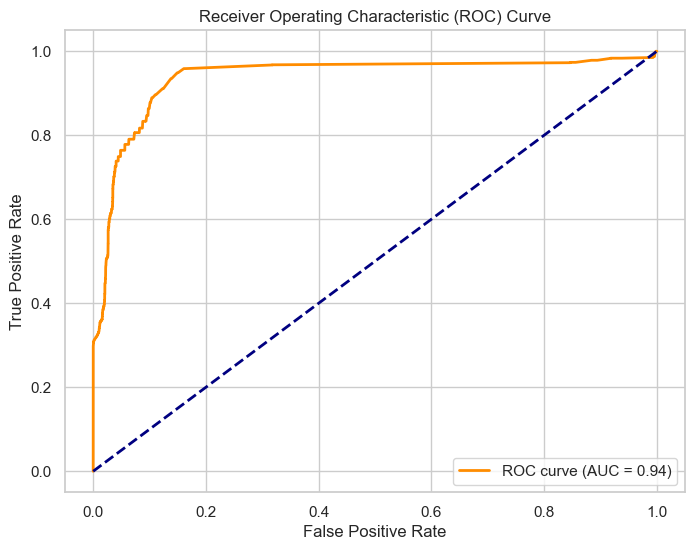

In [120]:
#########Probe
rf_model = RandomForestClassifier(n_estimators=100, random_state=0)

# Train the mode
rf_model.fit(X_Probe, Y_Probe)

# Make predictions on the test set
y_pred_proba = rf_model.predict_proba(X_Probe_test)[:, 1]  

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_Probe_test, y_pred_proba,pos_label=2)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# U2R

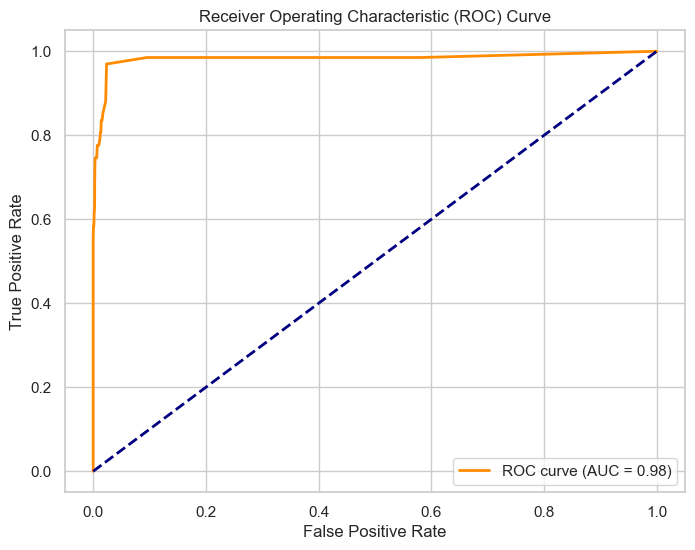

In [121]:
####U2R
rf_model = RandomForestClassifier(n_estimators=100, random_state=0)

# Train the model
rf_model.fit(X_U2R, Y_U2R)

# Make predictions on the test set
y_pred_probA_u = rf_model.predict_proba(X_U2R_test)[:, 1]  

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_U2R_test, y_pred_probA_u,pos_label=4)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# R2L

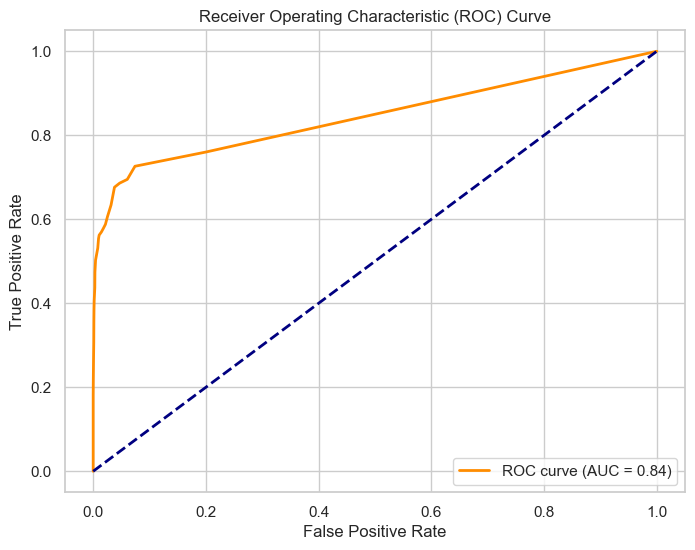

In [122]:
####U2R
rf_model = RandomForestClassifier(n_estimators=100, random_state=0)

# Train the model
rf_model.fit(X_R2L, Y_R2L)

# Make predictions on the test set
y_pred_proba = rf_model.predict_proba(X_R2L_test)[:, 1]  

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_R2L_test, y_pred_proba,pos_label=3)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()